In [1]:
import hvplot.pandas
import pandas as pd
import json
import requests
import matplotlib.pyplot as plt
import numpy as np
from numpy import datetime64
import datetime


In [2]:
# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
url = "https://data.lacity.org/resource/2nrs-mtv8.json?"
limit = "&$limit=1000000"
token = "$$app_token=2chCzz50gH6DpOapebwdtsXcQ"
# params = {"token": "$$app_token=2chCzz50gH6DpOapebwdtsXcQ",
#           "limit": "&$limit=10000"
# }
response = requests.get(url,limit).json()

In [3]:
# To check total rows
len(response)

932140

In [4]:
# response

In [5]:
# Create a dataframe
response_df = pd.DataFrame(response)
#Display the new dataframe
response_df.head()

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,crm_cd_2,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4
0,190326475,2020-03-01T00:00:00.000,2020-03-01T00:00:00.000,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,998,1900 S LONGWOOD AV,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN
1,200106753,2020-02-09T00:00:00.000,2020-02-08T00:00:00.000,1800,01,Central,0182,1,330,BURGLARY FROM VEHICLE,...,998,1000 S FLOWER ST,34.0444,-118.2628,1822 1402 0344,NaN,NaN,NaN,NaN,NaN
2,200320258,2020-11-11T00:00:00.000,2020-11-04T00:00:00.000,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,NaN,1400 W 37TH ST,34.021,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN
3,200907217,2023-05-10T00:00:00.000,2020-03-10T00:00:00.000,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,NaN,14000 RIVERSIDE DR,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN
4,220614831,2022-08-18T00:00:00.000,2020-08-17T00:00:00.000,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,NaN,1900 TRANSIENT,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN


In [6]:
#Total rows in new dataframe: 925,720
response_df["dr_no"].count()

932140

In [7]:
#Check the name of the columns
response_df.columns

Index(['dr_no', 'date_rptd', 'date_occ', 'time_occ', 'area', 'area_name',
       'rpt_dist_no', 'part_1_2', 'crm_cd', 'crm_cd_desc', 'vict_age',
       'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc', 'status',
       'status_desc', 'crm_cd_1', 'crm_cd_2', 'location', 'lat', 'lon',
       'mocodes', 'weapon_used_cd', 'weapon_desc', 'cross_street', 'crm_cd_3',
       'crm_cd_4'],
      dtype='object')

## Cleaning data

In [8]:
# Change latitude and longitute from object to float
response_df["lon"] = response_df["lon"].astype(float)
response_df["lat"] = response_df["lat"].astype(float)
#Confirm lon, lat as float
response_df.dtypes

dr_no              object
date_rptd          object
date_occ           object
time_occ           object
area               object
area_name          object
rpt_dist_no        object
part_1_2           object
crm_cd             object
crm_cd_desc        object
vict_age           object
vict_sex           object
vict_descent       object
premis_cd          object
premis_desc        object
status             object
status_desc        object
crm_cd_1           object
crm_cd_2           object
location           object
lat               float64
lon               float64
mocodes            object
weapon_used_cd     object
weapon_desc        object
cross_street       object
crm_cd_3           object
crm_cd_4           object
dtype: object

In [9]:
#Create a copy of the dataframe to preserve the original
response_df_formatted = response_df.copy()

In [10]:
#Create a clean Dataframe by drop latitud and longitute = 0
response_df_formatted=response_df_formatted.loc[response_df_formatted["lon"] != 0]

In [11]:
# Confirm dataframe as been cleaned
response_df_formatted.loc[response_df_formatted["lat"] == 0]

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,crm_cd_2,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4


In [12]:
#(LR)# To convert date occurence format, from object to date
# source: https://stackoverflow.com/questions/68296206/pandas-period-to-to-timestamp-giving-me-typeerror
response_df_formatted["date_occ"] =pd.to_datetime(response_df_formatted["date_occ"])
response_df_formatted

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,crm_cd_2,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4
0,190326475,2020-03-01T00:00:00.000,2020-03-01,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,998,1900 S LONGWOOD AV,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN
1,200106753,2020-02-09T00:00:00.000,2020-02-08,1800,01,Central,0182,1,330,BURGLARY FROM VEHICLE,...,998,1000 S FLOWER ST,34.0444,-118.2628,1822 1402 0344,NaN,NaN,NaN,NaN,NaN
2,200320258,2020-11-11T00:00:00.000,2020-11-04,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,NaN,1400 W 37TH ST,34.0210,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN
3,200907217,2023-05-10T00:00:00.000,2020-03-10,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,NaN,14000 RIVERSIDE DR,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN
4,220614831,2022-08-18T00:00:00.000,2020-08-17,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,NaN,1900 TRANSIENT,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
932135,241605270,2024-02-11T00:00:00.000,2024-02-11,1920,16,Foothill,1681,2,888,TRESPASSING,...,NaN,8700 SHARP AV,34.2278,-118.4051,0913 1202 1501,NaN,NaN,NaN,NaN,NaN
932136,241604405,2024-01-14T00:00:00.000,2024-01-13,0720,16,Foothill,1673,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,NaN,8700 LANKERSHIM BL,34.2271,-118.3878,0400 1822 1310 0416,207,OTHER KNIFE,NaN,NaN,NaN
932137,242106032,2024-02-20T00:00:00.000,2024-02-17,2330,21,Topanga,2103,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),...,NaN,22700 NAPA ST,34.2260,-118.6214,0385,NaN,NaN,NaN,NaN,NaN
932138,242004546,2024-01-16T00:00:00.000,2024-01-16,1510,20,Olympic,2013,2,624,BATTERY - SIMPLE ASSAULT,...,NaN,HOBART BL,34.0690,-118.3054,2047 0400 0429 0444 1202 1822,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",3RD ST,NaN,NaN


In [13]:
#(LR)# To confirm that date occurence format change successfully
response_df_formatted.dtypes

dr_no                     object
date_rptd                 object
date_occ          datetime64[ns]
time_occ                  object
area                      object
area_name                 object
rpt_dist_no               object
part_1_2                  object
crm_cd                    object
crm_cd_desc               object
vict_age                  object
vict_sex                  object
vict_descent              object
premis_cd                 object
premis_desc               object
status                    object
status_desc               object
crm_cd_1                  object
crm_cd_2                  object
location                  object
lat                      float64
lon                      float64
mocodes                   object
weapon_used_cd            object
weapon_desc               object
cross_street              object
crm_cd_3                  object
crm_cd_4                  object
dtype: object

In [14]:
#(LR)# Drop crimes occured before Mar 01/2020 and past Mar31/2024 (Team agreed on excluding Apr/2024 data, as it will gather partial data)
#source = https://www.geeksforgeeks.org/how-to-filter-dataframe-rows-based-on-the-date-in-pandas/
response_df_formatted = response_df_formatted.loc[(response_df_formatted["date_occ"] >= "2020-03-01") & (response_df_formatted["date_occ"] <="2024-03-31")]
response_df_formatted

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,crm_cd_2,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4
0,190326475,2020-03-01T00:00:00.000,2020-03-01,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,998,1900 S LONGWOOD AV,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN
2,200320258,2020-11-11T00:00:00.000,2020-11-04,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,NaN,1400 W 37TH ST,34.0210,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN
3,200907217,2023-05-10T00:00:00.000,2020-03-10,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,NaN,14000 RIVERSIDE DR,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN
4,220614831,2022-08-18T00:00:00.000,2020-08-17,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,NaN,1900 TRANSIENT,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN
5,231808869,2023-04-04T00:00:00.000,2020-12-01,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,...,NaN,9900 COMPTON AV,33.9467,-118.2463,1822 0100 0930 0929,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
932135,241605270,2024-02-11T00:00:00.000,2024-02-11,1920,16,Foothill,1681,2,888,TRESPASSING,...,NaN,8700 SHARP AV,34.2278,-118.4051,0913 1202 1501,NaN,NaN,NaN,NaN,NaN
932136,241604405,2024-01-14T00:00:00.000,2024-01-13,0720,16,Foothill,1673,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,NaN,8700 LANKERSHIM BL,34.2271,-118.3878,0400 1822 1310 0416,207,OTHER KNIFE,NaN,NaN,NaN
932137,242106032,2024-02-20T00:00:00.000,2024-02-17,2330,21,Topanga,2103,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),...,NaN,22700 NAPA ST,34.2260,-118.6214,0385,NaN,NaN,NaN,NaN,NaN
932138,242004546,2024-01-16T00:00:00.000,2024-01-16,1510,20,Olympic,2013,2,624,BATTERY - SIMPLE ASSAULT,...,NaN,HOBART BL,34.0690,-118.3054,2047 0400 0429 0444 1202 1822,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",3RD ST,NaN,NaN


# To group the data by major COVID events (Restriccions-Begin, Vaccine, Booster, Restrictions_end)

In [15]:
#(LR)# Group the database by Q1-Q2, Q3- Q4
clean_2021_LR = response_df_formatted.loc[(response_df_formatted["date_occ"] >= "2020-03-01") & (response_df_formatted["date_occ"] < "2021-03-01")]
clean_2122_LR = response_df_formatted.loc[(response_df_formatted["date_occ"] >= "2021-03-01") & (response_df_formatted["date_occ"] < "2022-03-01")]
clean_2223_LR = response_df_formatted.loc[(response_df_formatted["date_occ"] >= "2022-03-01") & (response_df_formatted["date_occ"] < "2023-03-01")]
clean_2324_LR = response_df_formatted.loc[(response_df_formatted["date_occ"] >= "2023-03-01") & (response_df_formatted["date_occ"] < "2024-03-01")]
clean_2021_LR["Year"] = "Q1"
clean_2122_LR["Year"] = "Q2"
clean_2223_LR["Year"] = "Q3"
clean_2324_LR["Year"] = "Q4"
clean_2021_LR.reset_index(drop=True)
clean_2122_LR.reset_index(drop=True)
clean_2223_LR.reset_index(drop=True)
clean_2324_LR.reset_index(drop=True)

C:\Users\PC\AppData\Local\Temp\ipykernel_11124\1704308577.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_2021_LR["Year"] = "Q1"
C:\Users\PC\AppData\Local\Temp\ipykernel_11124\1704308577.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_2122_LR["Year"] = "Q2"
C:\Users\PC\AppData\Local\Temp\ipykernel_11124\1704308577.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4,Year
0,240504190,2024-01-05T00:00:00.000,2024-01-05,1548,05,Harbor,0566,1,310,BURGLARY,...,300 W 11TH ST,33.7342,-118.2836,0314 0329 1601,NaN,NaN,NaN,NaN,NaN,Q4
1,230611294,2023-06-17T00:00:00.000,2023-06-17,1140,06,Hollywood,0668,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),...,5500 W SUNSET BL,34.0981,-118.3092,1822 0325 2004,NaN,NaN,NaN,NaN,NaN,Q4
2,231515059,2023-09-19T00:00:00.000,2023-09-19,1030,15,N Hollywood,1549,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,BURBANK BL,34.1721,-118.3616,1309 0421 0913 0334,102,HAND GUN,CAHUENGA BL,NaN,NaN,Q4
3,230110347,2023-04-11T00:00:00.000,2023-04-10,0816,01,Central,0192,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,1300 S FLOWER ST,34.0401,-118.2669,0344 1822,NaN,NaN,NaN,NaN,NaN,Q4
4,230617683,2023-11-10T00:00:00.000,2023-11-08,0800,06,Hollywood,0663,2,662,"BUNCO, GRAND THEFT",...,1200 SEWARD ST,34.0907,-118.3384,1501 1900 0701 1822,NaN,NaN,NaN,NaN,NaN,Q4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228804,241605270,2024-02-11T00:00:00.000,2024-02-11,1920,16,Foothill,1681,2,888,TRESPASSING,...,8700 SHARP AV,34.2278,-118.4051,0913 1202 1501,NaN,NaN,NaN,NaN,NaN,Q4
228805,241604405,2024-01-14T00:00:00.000,2024-01-13,0720,16,Foothill,1673,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,8700 LANKERSHIM BL,34.2271,-118.3878,0400 1822 1310 0416,207,OTHER KNIFE,NaN,NaN,NaN,Q4
228806,242106032,2024-02-20T00:00:00.000,2024-02-17,2330,21,Topanga,2103,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),...,22700 NAPA ST,34.2260,-118.6214,0385,NaN,NaN,NaN,NaN,NaN,Q4
228807,242004546,2024-01-16T00:00:00.000,2024-01-16,1510,20,Olympic,2013,2,624,BATTERY - SIMPLE ASSAULT,...,HOBART BL,34.0690,-118.3054,2047 0400 0429 0444 1202 1822,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",3RD ST,NaN,NaN,Q4


In [16]:
#(LR)# Including the column into the master database
combodata_LR = pd.concat([clean_2021_LR, clean_2122_LR, clean_2223_LR, clean_2324_LR], ignore_index=False, axis=0)
combodata_LR.head()

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4,Year
0,190326475,2020-03-01T00:00:00.000,2020-03-01,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,1900 S LONGWOOD AV,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN,Q1
2,200320258,2020-11-11T00:00:00.000,2020-11-04,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,1400 W 37TH ST,34.0210,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN,Q1
3,200907217,2023-05-10T00:00:00.000,2020-03-10,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,14000 RIVERSIDE DR,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN,Q1
4,220614831,2022-08-18T00:00:00.000,2020-08-17,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,1900 TRANSIENT,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN,Q1
5,231808869,2023-04-04T00:00:00.000,2020-12-01,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,...,9900 COMPTON AV,33.9467,-118.2463,1822 0100 0930 0929,NaN,NaN,NaN,NaN,NaN,Q1


In [17]:
#(LR)# Extract year and month from date and put it in a new column
# Source:  https://stackoverflow.com/questions/37632766/python-pandas-get-fiscal-quarter-from-fiscal-year-and-month-for-uk
response_df_formatted["quarter"] = response_df_formatted["date_occ"].dt.quarter
response_df_formatted

C:\Users\PC\AppData\Local\Temp\ipykernel_11124\1070286101.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  response_df_formatted["quarter"] = response_df_formatted["date_occ"].dt.quarter


,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,location,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4,quarter
0,190326475,2020-03-01T00:00:00.000,2020-03-01,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,1900 S LONGWOOD AV,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN,1
2,200320258,2020-11-11T00:00:00.000,2020-11-04,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,1400 W 37TH ST,34.0210,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN,4
3,200907217,2023-05-10T00:00:00.000,2020-03-10,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,14000 RIVERSIDE DR,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN,1
4,220614831,2022-08-18T00:00:00.000,2020-08-17,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,1900 TRANSIENT,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN,3
5,231808869,2023-04-04T00:00:00.000,2020-12-01,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,...,9900 COMPTON AV,33.9467,-118.2463,1822 0100 0930 0929,NaN,NaN,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
932135,241605270,2024-02-11T00:00:00.000,2024-02-11,1920,16,Foothill,1681,2,888,TRESPASSING,...,8700 SHARP AV,34.2278,-118.4051,0913 1202 1501,NaN,NaN,NaN,NaN,NaN,1
932136,241604405,2024-01-14T00:00:00.000,2024-01-13,0720,16,Foothill,1673,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,8700 LANKERSHIM BL,34.2271,-118.3878,0400 1822 1310 0416,207,OTHER KNIFE,NaN,NaN,NaN,1
932137,242106032,2024-02-20T00:00:00.000,2024-02-17,2330,21,Topanga,2103,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),...,22700 NAPA ST,34.2260,-118.6214,0385,NaN,NaN,NaN,NaN,NaN,1
932138,242004546,2024-01-16T00:00:00.000,2024-01-16,1510,20,Olympic,2013,2,624,BATTERY - SIMPLE ASSAULT,...,HOBART BL,34.0690,-118.3054,2047 0400 0429 0444 1202 1822,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",3RD ST,NaN,NaN,1


In [18]:
#(LR)# Extract calendar year from date and put it in a new column
#year = year of occurrence
response_df_formatted['Cal_Year'] = response_df_formatted["date_occ"].dt.year
response_df_formatted.head()

C:\Users\PC\AppData\Local\Temp\ipykernel_11124\555653527.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  response_df_formatted['Cal_Year'] = response_df_formatted["date_occ"].dt.year


,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4,quarter,Cal_Year
0,190326475,2020-03-01T00:00:00.000,2020-03-01,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN,1,2020
2,200320258,2020-11-11T00:00:00.000,2020-11-04,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,34.0210,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN,4,2020
3,200907217,2023-05-10T00:00:00.000,2020-03-10,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN,1,2020
4,220614831,2022-08-18T00:00:00.000,2020-08-17,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN,3,2020
5,231808869,2023-04-04T00:00:00.000,2020-12-01,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,...,33.9467,-118.2463,1822 0100 0930 0929,NaN,NaN,NaN,NaN,NaN,4,2020


In [19]:
#(LR)# To confirm year column is store successfully for the entire data
response_df_formatted.count()

dr_no             888978
date_rptd         888978
date_occ          888978
time_occ          888978
area              888978
area_name         888978
rpt_dist_no       888978
part_1_2          888978
crm_cd            888978
crm_cd_desc       888978
vict_age          888978
vict_sex          769434
vict_descent      769425
premis_cd         888968
premis_desc       888437
status            888978
status_desc       888978
crm_cd_1          888967
crm_cd_2           64364
location          888978
lat               888978
lon               888978
mocodes           763267
weapon_used_cd    306313
weapon_desc       306313
cross_street      138695
crm_cd_3            2164
crm_cd_4              61
quarter           888978
Cal_Year          888978
dtype: int64

In [20]:
#(LR)# Group the total crimes by quarter
#Source: https://scales.arabpsychology.com/stats/how-to-group-by-quarter-in-pandas-dataframe-with-example/
total_crime_quarter = response_df_formatted.groupby(response_df_formatted["date_occ"].dt.to_period("Q"))["crm_cd"].count()
total_crime_quarter

date_occ
2020Q1    16152
2020Q2    49667
2020Q3    49438
2020Q4    47816
2021Q1    48004
2021Q2    49838
2021Q3    54938
2021Q4    55428
2022Q1    55955
2022Q2    60504
2022Q3    59411
2022Q4    59040
2023Q1    57501
2023Q2    56406
2023Q3    59118
2023Q4    58330
2024Q1    51432
Freq: Q-DEC, Name: crm_cd, dtype: int64

In [21]:
#(LR)# Group the total crimes by calendar year
#Source: https://scales.arabpsychology.com/stats/how-to-group-by-quarter-in-pandas-dataframe-with-example/
total_crimes = combodata_LR.groupby(["Year"])["crm_cd"].count()
total_crimes

Year
Q1    194866
Q2    212653
Q3    237014
Q4    228809
Name: crm_cd, dtype: int64

# To Group the data by quarters (Calendar Year)

In [22]:
#(LR)# group by total crimes / Q1 calendar year
response_df_q1 = response_df_formatted.loc[response_df_formatted["quarter"] == 1]
response_df_q1.groupby(["Cal_Year"])["dr_no"].count()


Cal_Year
2020    16152
2021    48004
2022    55955
2023    57501
2024    51432
Name: dr_no, dtype: int64

In [23]:
#(LR)# group by total crimes / Q2 calendar year
response_df_q2 = response_df_formatted.loc[response_df_formatted["quarter"] == 2]
response_df_q2.groupby(["Cal_Year"])["dr_no"].count()

Cal_Year
2020    49667
2021    49838
2022    60504
2023    56406
Name: dr_no, dtype: int64

In [24]:
#(LR)# group by total crimes / Q3 calendar year
response_df_q3 = response_df_formatted.loc[response_df_formatted["quarter"] == 3]
response_df_q3.groupby(["Cal_Year"])["dr_no"].count()

Cal_Year
2020    49438
2021    54938
2022    59411
2023    59118
Name: dr_no, dtype: int64

In [25]:
#(LR)# group by total crimes / Q4 calendar year
response_df_q4 = response_df_formatted.loc[response_df_formatted["quarter"] == 4]
response_df_q4.groupby(["Cal_Year"])["dr_no"].count()

Cal_Year
2020    47816
2021    55428
2022    59040
2023    58330
Name: dr_no, dtype: int64

## Geo graph

In [26]:
# Configure the map plot, adding the year of the crime by location
map_plot_0 = response_df_formatted.hvplot.points(
    "lon",
    "lat",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 600,
    color="Year",
    title = "Crime by Coordinates",
    alpha = 0.5
)

c:\Users\PC\anaconda3\envs\inclassfeb2024\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


In [27]:
map_plot_0

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [lon,lat]

In [29]:
# y_value = response_df_formatted.groupby(["Year"]).count()


In [ ]:
# y_value.reset_index(inplace=True)

In [ ]:
# y_value.plot(kind="bar",x="Year",y="dr_no")

In [30]:
#(LR)# Extract calendar year from date and put it in a new column
#year = year of occurrence
response_df_formatted['Cal_Year'] = response_df_formatted["date_occ"].dt.year
response_df_formatted.head()

C:\Users\PC\AppData\Local\Temp\ipykernel_11124\555653527.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  response_df_formatted['Cal_Year'] = response_df_formatted["date_occ"].dt.year


,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,lat,lon,mocodes,weapon_used_cd,weapon_desc,cross_street,crm_cd_3,crm_cd_4,quarter,Cal_Year
0,190326475,2020-03-01T00:00:00.000,2020-03-01,2130,07,Wilshire,0784,1,510,VEHICLE - STOLEN,...,34.0375,-118.3506,NaN,NaN,NaN,NaN,NaN,NaN,1,2020
2,200320258,2020-11-11T00:00:00.000,2020-11-04,1700,03,Southwest,0356,1,480,BIKE - STOLEN,...,34.0210,-118.3002,0344 1251,NaN,NaN,NaN,NaN,NaN,4,2020
3,200907217,2023-05-10T00:00:00.000,2020-03-10,2037,09,Van Nuys,0964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,34.1576,-118.4387,0325 1501,NaN,NaN,NaN,NaN,NaN,1,2020
4,220614831,2022-08-18T00:00:00.000,2020-08-17,1200,06,Hollywood,0666,2,354,THEFT OF IDENTITY,...,34.0944,-118.3277,1822 1501 0930 2004,NaN,NaN,NaN,NaN,NaN,3,2020
5,231808869,2023-04-04T00:00:00.000,2020-12-01,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,...,33.9467,-118.2463,1822 0100 0930 0929,NaN,NaN,NaN,NaN,NaN,4,2020


## Identification of Violent Crimes by total number occured in the period

In [31]:
#(LR)# To identify the top 10 crime codes
total_crm_cd = combodata_LR["crm_cd"].value_counts()
total_crm_cd_percentage = total_crm_cd/response_df_formatted["dr_no"].count()*100
rounded_total_crm = round(total_crm_cd_percentage,2)
rounded_total_crm.head(10)

crm_cd
510    10.67
624     7.75
354     6.17
310     6.06
330     6.01
740     5.97
230     5.64
440     4.96
626     4.85
420     3.74
Name: count, dtype: float64

In [32]:
#(LR)# To identify the top 10 crimes description
total_crm_desc = combodata_LR["crm_cd_desc"].value_counts()
# total_crm_desc in %
total_crm_desc_percentage = total_crm_desc/response_df_formatted["dr_no"].count()*100
rounded_total_crm = round(total_crm_desc_percentage,2)
total_crm_desc


crm_cd_desc
VEHICLE - STOLEN                                      94862
BATTERY - SIMPLE ASSAULT                              68876
THEFT OF IDENTITY                                     54875
BURGLARY                                              53831
BURGLARY FROM VEHICLE                                 53427
                                                      ...  
FIREARMS EMERGENCY PROTECTIVE ORDER (FIREARMS EPO)        5
DISHONEST EMPLOYEE ATTEMPTED THEFT                        4
FIREARMS RESTRAINING ORDER (FIREARMS RO)                  4
FAILURE TO DISPERSE                                       3
TRAIN WRECKING                                            1
Name: count, Length: 139, dtype: int64

In [33]:
#(LR) To identify threshold
threshold = 50000
other_count = total_crm_desc[total_crm_desc < threshold].sum()
total_crm_desc = total_crm_desc[total_crm_desc >= threshold]
total_crm_desc_series = pd.Series(other_count, index=['others'])
total_crm_desc = pd.concat([total_crm_desc, total_crm_desc_series])
total_crm_desc

VEHICLE - STOLEN                                            94862
BATTERY - SIMPLE ASSAULT                                    68876
THEFT OF IDENTITY                                           54875
BURGLARY                                                    53831
BURGLARY FROM VEHICLE                                       53427
VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)     53080
ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT              50137
others                                                     444254
dtype: int64

Text(0, 0.5, '')

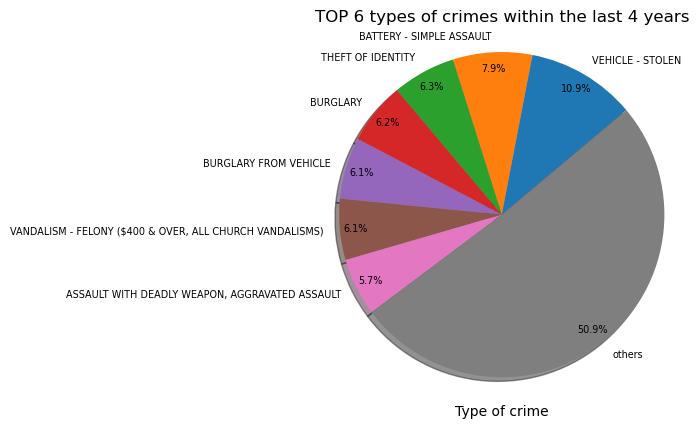

In [34]:
#(LR)# Create a pie chart based off of the group series from before (using others)
#Source: Chart format https://matplotlib.org/stable/gallery/pie_and_polar_charts/pie_features.html
explode = [0, 0, 0, 0.1, 0]
pie_chart_1 = total_crm_desc.plot(kind="pie", y="premis_desc", title="TOP 6 types of crimes within the last 4 years", 
                                     autopct="%1.1f%%", shadow=True, textprops={'size': 'x-small'}, startangle=40, pctdistance=0.9, labeldistance=1.1, radius=1.1)

# Set the xlabel and ylabel
pie_chart_1.set_xlabel("Type of crime")
pie_chart_1.set_ylabel("")

##Dataframe creation for top 3 violent crimes (Assault, Theft, Aggravated assault)

In [35]:
#(LR)# Create dataframe for assaults only
# source: https://stackoverflow.com/questions/34682828/extracting-specific-selected-columns-to-ndifferenw-dataframe-as-a-copy
assaults_df = combodata_LR.filter(["dr_no","date_occ","area_name", "crm_cd", "crm_cd_desc", "premis_desc","weapon_used_cd", "quarter", "Year", "yr_qr"])
assaults_df = assaults_df.loc[assaults_df["crm_cd"] == "624"]
assaults_df

,dr_no,date_occ,area_name,crm_cd,crm_cd_desc,premis_desc,weapon_used_cd,Year
9,211904005,2020-12-31,Mission,624,BATTERY - SIMPLE ASSAULT,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",400,Q1
29,220808837,2020-03-30,West LA,624,BATTERY - SIMPLE ASSAULT,SINGLE FAMILY DWELLING,400,Q1
198,211206198,2020-12-20,77th Street,624,BATTERY - SIMPLE ASSAULT,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",400,Q1
208,221715311,2020-07-11,Devonshire,624,BATTERY - SIMPLE ASSAULT,SINGLE FAMILY DWELLING,400,Q1
249,231107419,2020-08-08,Northeast,624,BATTERY - SIMPLE ASSAULT,"VEHICLE, PASSENGER/TRUCK",400,Q1
...,...,...,...,...,...,...,...,...
932041,241205295,2024-01-22,77th Street,624,BATTERY - SIMPLE ASSAULT,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",400,Q4
932043,241205279,2024-01-21,77th Street,624,BATTERY - SIMPLE ASSAULT,STREET,400,Q4
932050,240704113,2024-01-03,Wilshire,624,BATTERY - SIMPLE ASSAULT,PARKING LOT,400,Q4
932076,241406782,2024-02-29,Pacific,624,BATTERY - SIMPLE ASSAULT,SIDEWALK,400,Q4


In [36]:
#(LR)# Create dataframe for theft of identity only
# source: https://stackoverflow.com/questions/34682828/extracting-specific-selected-columns-to-ndifferenw-dataframe-as-a-copy
personal_theft_df = combodata_LR.filter(["dr_no","date_occ","area_name", "crm_cd", "crm_cd_desc", "premis_desc","weapon_used_cd", "quarter", "Year", "yr_qr"])
personal_theft_df = personal_theft_df.loc[personal_theft_df["crm_cd"] == "354"]
personal_theft_df

,dr_no,date_occ,area_name,crm_cd,crm_cd_desc,premis_desc,weapon_used_cd,Year
4,220614831,2020-08-17,Hollywood,354,THEFT OF IDENTITY,SIDEWALK,NaN,Q1
5,231808869,2020-12-01,Southeast,354,THEFT OF IDENTITY,SINGLE FAMILY DWELLING,NaN,Q1
6,230110144,2020-07-03,Central,354,THEFT OF IDENTITY,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,Q1
7,220314085,2020-05-12,Southwest,354,THEFT OF IDENTITY,CELL PHONE STORE,NaN,Q1
8,231309864,2020-12-09,Newton,354,THEFT OF IDENTITY,CYBERSPACE,NaN,Q1
...,...,...,...,...,...,...,...,...
931879,240906066,2024-02-20,Van Nuys,354,THEFT OF IDENTITY,SINGLE FAMILY DWELLING,NaN,Q4
931893,242005741,2024-02-04,Olympic,354,THEFT OF IDENTITY,SINGLE FAMILY DWELLING,NaN,Q4
931921,241210015,2024-02-27,77th Street,354,THEFT OF IDENTITY,SINGLE FAMILY DWELLING,NaN,Q4
932045,241005453,2024-02-05,West Valley,354,THEFT OF IDENTITY,SINGLE FAMILY DWELLING,NaN,Q4


In [37]:
#(LR)# Create dataframe for aggravated assault (single family dwelling excl)
agg_assault_df = combodata_LR.filter(["dr_no","date_occ","area_name", "crm_cd", "crm_cd_desc", "premis_desc","weapon_used_cd", "quarter", "Year", "yr_qr"])
agg_assault_df = agg_assault_df.loc[(agg_assault_df["crm_cd"] == "230") & (agg_assault_df["premis_desc"] != "SINGLE FAMILY DWELLING")]
agg_assault_df


,dr_no,date_occ,area_name,crm_cd,crm_cd_desc,premis_desc,weapon_used_cd,Year
18,210705560,2020-11-27,Wilshire,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",STREET,307,Q1
221,220507155,2020-12-01,Harbor,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",ALLEY,106,Q1
230,220606971,2020-07-02,Hollywood,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",SIDEWALK,400,Q1
932,230221295,2020-11-18,Rampart,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",OTHER BUSINESS,512,Q1
1353,211204028,2020-12-31,77th Street,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",STREET,106,Q1
...,...,...,...,...,...,...,...,...
932034,241805817,2024-02-07,Southeast,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",STREET,212,Q4
932055,240400628,2024-02-16,Hollenbeck,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",STREET,102,Q4
932081,240404535,2024-01-18,Hollenbeck,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",STREET,500,Q4
932082,241104022,2024-01-01,Northeast,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",BAR/COCKTAIL/NIGHTCLUB,400,Q4


## Deep dive into each Top 3 violent crime

## Violent Crime = Assault

In [38]:
#(LR)# Get total numbero of assaults per year
total_assault_year = assaults_df.groupby(["Year"])["crm_cd"].count()
total_assault_year

Year
Q1    15461
Q2    16477
Q3    18024
Q4    18914
Name: crm_cd, dtype: int64

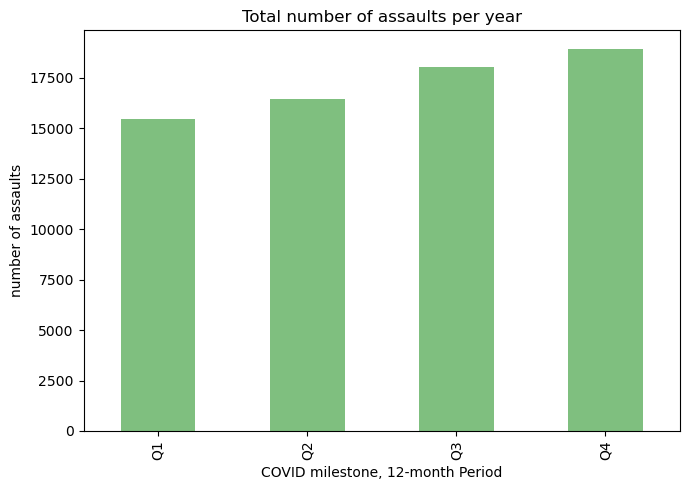

In [39]:
#(LR)# Create a bar chart based off of the total assaults per year
bar_chart_total_assaults = total_assault_year.plot(kind='bar', figsize=(7,5), color="green", alpha=0.5)

# Set the xlabel and ylabel using class methods
bar_chart_total_assaults.set_xlabel("COVID milestone, 12-month Period")
bar_chart_total_assaults.set_ylabel("number of assaults")
bar_chart_total_assaults.set_title("Total number of assaults per year")

plt.tight_layout()

In [40]:
#(LR) # Count the total number of premise descrpition for Assault, identify the most highest values and define a threshold to combine the rest in "others" category.
premis_count = assaults_df["premis_desc"].value_counts()
premis_count

premis_desc
SINGLE FAMILY DWELLING                          11631
STREET                                          10933
MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)    10485
SIDEWALK                                         7860
PARKING LOT                                      4187
                                                ...  
OTHER PLACE OF WORSHIP                              1
OIL REFINERY                                        1
MTA - SILVER LINE - LAC/USC MEDICAL CENTER          1
MTA - ORANGE LINE - PIERCE COLLEGE                  1
PEDESTRIAN OVERCROSSING                             1
Name: count, Length: 271, dtype: int64

In [41]:
#(LR) # To create a threshold of 800 for "others" 
threshold = 800
other_count = premis_count[premis_count < threshold].sum()
premis_count = premis_count[premis_count >= threshold]
premis_count_series = pd.Series(other_count, index=['other'])
premis_count = pd.concat([premis_count, premis_count_series])
premis_count

SINGLE FAMILY DWELLING                          11631
STREET                                          10933
MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)    10485
SIDEWALK                                         7860
PARKING LOT                                      4187
OTHER BUSINESS                                   3736
RESTAURANT/FAST FOOD                             1366
MTA BUS                                           921
DRIVEWAY                                          868
other                                           16872
dtype: int64

Text(0, 0.5, '')

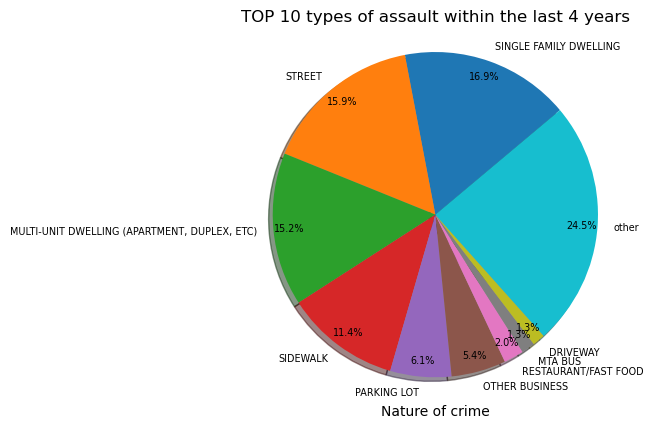

In [43]:
#(LR)# Create a pie chart based off of the group series from before (using others)
#Source: Chart format https://matplotlib.org/stable/gallery/pie_and_polar_charts/pie_features.html
explode = [0, 0, 0, 0.1, 0]
pie_chart_1 = premis_count.plot(kind="pie", y="premis_desc", title="TOP 10 types of assault within the last 4 years", 
                                     autopct="%1.1f%%", shadow=True, textprops={'size': 'x-small'}, startangle=40, pctdistance=0.9, labeldistance=1.1, radius=1.1)

# Set the xlabel and ylabel
pie_chart_1.set_xlabel("Nature of crime")
pie_chart_1.set_ylabel("")

In [44]:
#(LR)# To see the trend on single family dwelling violence within the years
single_fam_dwell = assaults_df.loc[assaults_df["premis_desc"] == "SINGLE FAMILY DWELLING"]
single_fam_df = single_fam_dwell.groupby(["Year"])["premis_desc"].count()


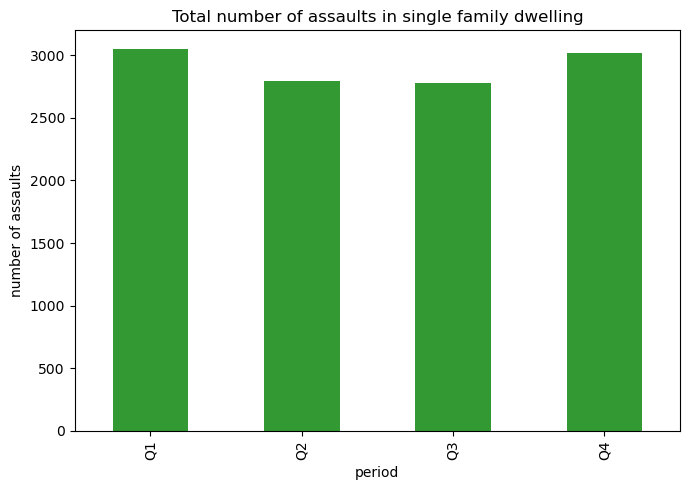

In [45]:
#(LR)# Create a bar chart based off of the total assaults by single family dwelling per period
bar_chart_total_single_fam_df = single_fam_df.plot(kind='bar', figsize=(7,5), color="green", alpha=0.8)
          
# Set the xlabel and ylabel using class methods
bar_chart_total_single_fam_df.set_xlabel("period")
bar_chart_total_single_fam_df.set_ylabel("number of assaults")
bar_chart_total_single_fam_df.set_title("Total number of assaults in single family dwelling")

plt.tight_layout()

In [46]:
#(LR)# To see the trend on street violence within the years
street_violence = assaults_df.loc[assaults_df["premis_desc"] == "STREET"]
street_violence = street_violence.groupby(["Year"])["premis_desc"].count()
street_violence


Year
Q1    2299
Q2    2600
Q3    2860
Q4    3174
Name: premis_desc, dtype: int64

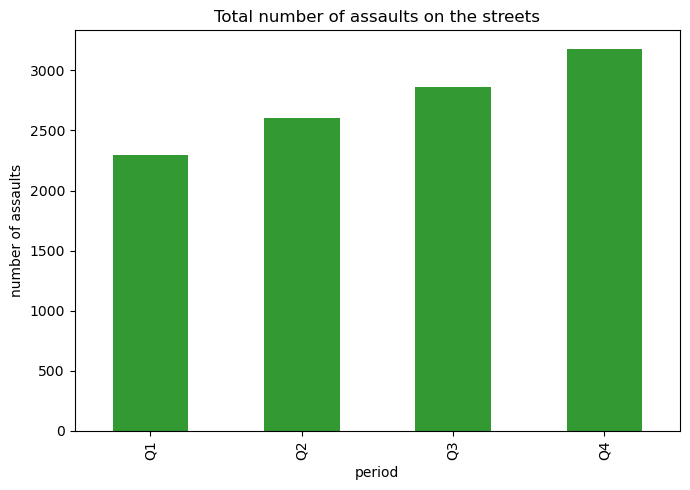

In [48]:
#(LR)# Create a bar chart based off of the total assaults by street violence per period
bar_chart_total_street_violence_df = street_violence.plot(kind='bar', figsize=(7,5), color="green", alpha=0.8)

# Set the xlabel and ylabel using class methods
bar_chart_total_street_violence_df.set_xlabel("period")
bar_chart_total_street_violence_df.set_ylabel("number of assaults")
bar_chart_total_street_violence_df.set_title("Total number of assaults on the streets")


plt.tight_layout()

In [49]:
#(LR)# To see the trend on sidewalk violence within the years
sidewalk_violence = assaults_df.loc[assaults_df["premis_desc"] == "SIDEWALK"]
sidewalk_violence = sidewalk_violence.groupby(["Year"])["premis_desc"].count()
sidewalk_violence

Year
Q1    1791
Q2    1878
Q3    2100
Q4    2091
Name: premis_desc, dtype: int64

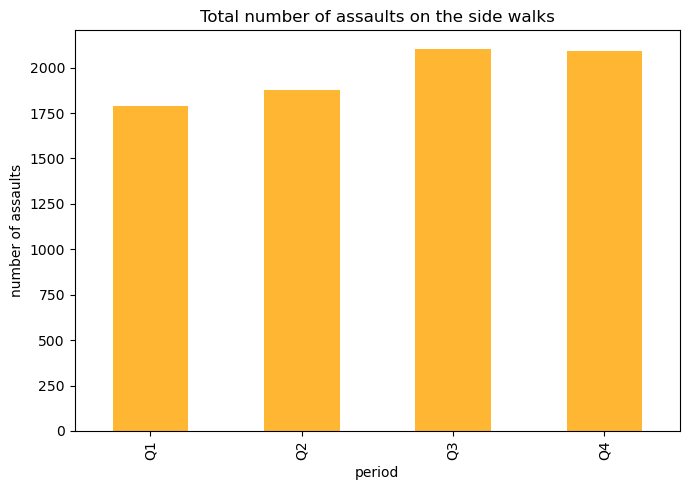

In [50]:
#(LR)# Create a bar chart based off of the total assaults by street violence per period
bar_chart_total_sidewalk_df = sidewalk_violence.plot(kind='bar', figsize=(7,5), color="orange", alpha=0.8)

# Set the xlabel and ylabel using class methods
bar_chart_total_sidewalk_df.set_xlabel("period")
bar_chart_total_sidewalk_df.set_ylabel("number of assaults")
bar_chart_total_sidewalk_df.set_title("Total number of assaults on the side walks")

plt.tight_layout()

## Violent Crime = Theft

In [51]:
#(LR)# Get total number of thefts per year
total_theft_year = personal_theft_df.groupby(["Year"])["crm_cd"].count()
total_theft_year

Year
Q1     8754
Q2    12367
Q3    23409
Q4    10345
Name: crm_cd, dtype: int64

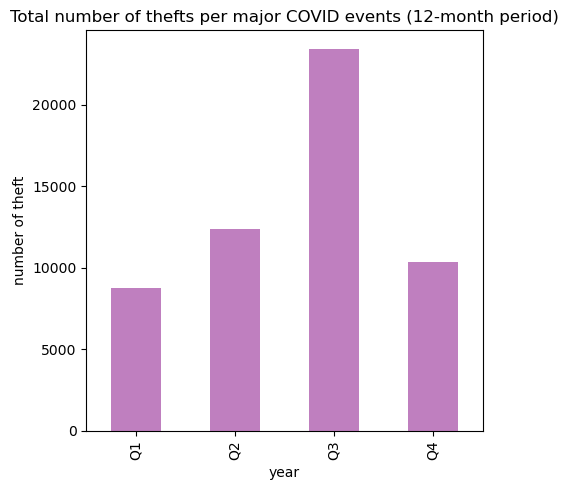

In [52]:
#(LR)# Create a bar chart based off of the total theft per year
bar_chart_total_theft = total_theft_year.plot(kind='bar', figsize=(5,5), color="purple", alpha=0.5)

# Set the xlabel and ylabel using class methods
bar_chart_total_theft.set_xlabel("year")
bar_chart_total_theft.set_ylabel("number of theft")
bar_chart_total_theft.set_title("Total number of thefts per major COVID events (12-month period)")

plt.tight_layout()

## Violent Crime = Aggravated assaults

In [53]:
#(LR)# Get total number of thefts per year
total_aggrav_assault_year = agg_assault_df.groupby(["Year"])["crm_cd"].count()
total_aggrav_assault_year

Year
Q1    10464
Q2    11630
Q3    11499
Q4    11357
Name: crm_cd, dtype: int64

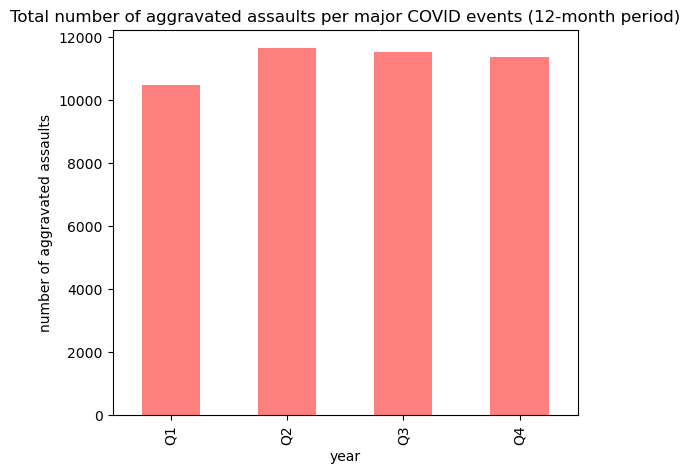

In [54]:
#(LR)# Create a bar chart based off of the total theft per year
bar_chart_total_agg_assault = total_aggrav_assault_year.plot(kind='bar', figsize=(6,5), color="red", alpha=0.5)

# Set the xlabel and ylabel using class methods
bar_chart_total_agg_assault.set_xlabel("year")
bar_chart_total_agg_assault.set_ylabel("number of aggravated assaults")
bar_chart_total_agg_assault.set_title("Total number of aggravated assaults per major COVID events (12-month period)")
plt.show()

## Group TOP 3 Violent crimes and compare them against total crimes

## Grouped by Quarter

In [55]:
#(LR)# Group the total assaults by quarter
assaults_quarter = assaults_df.groupby(assaults_df["date_occ"].dt.to_period("Q"))["crm_cd"].count()
assaults_quarter

date_occ
2020Q1    1346
2020Q2    3858
2020Q3    4298
2020Q4    3733
2021Q1    3415
2021Q2    3886
2021Q3    4576
2021Q4    4084
2022Q1    4178
2022Q2    4666
2022Q3    4761
2022Q4    4453
2023Q1    4215
2023Q2    4788
2023Q3    5039
2023Q4    4787
2024Q1    2793
Freq: Q-DEC, Name: crm_cd, dtype: int64

In [56]:
#(LR)# Group the total Theft by quarter
theft_quarter = personal_theft_df.groupby(personal_theft_df["date_occ"].dt.to_period("Q"))["crm_cd"].count()
theft_quarter

date_occ
2020Q1     713
2020Q2    2053
2020Q3    2095
2020Q4    2225
2021Q1    2616
2021Q2    2644
2021Q3    2798
2021Q4    3184
2022Q1    4594
2022Q2    5953
2022Q3    5246
2022Q4    6207
2023Q1    5479
2023Q2    2805
2023Q3    2636
2023Q4    2261
2024Q1    1366
Freq: Q-DEC, Name: crm_cd, dtype: int64

In [57]:
#(LR)# Group the total robbery by quarter
agg_assaults_quarter = agg_assault_df.groupby(agg_assault_df["date_occ"].dt.to_period("Q"))["crm_cd"].count()
agg_assaults_quarter

date_occ
2020Q1     656
2020Q2    2569
2020Q3    2907
2020Q4    2748
2021Q1    2448
2021Q2    2891
2021Q3    3343
2021Q4    2789
2022Q1    2684
2022Q2    3130
2022Q3    3125
2022Q4    2643
2023Q1    2530
2023Q2    2871
2023Q3    3179
2023Q4    2764
2024Q1    1673
Freq: Q-DEC, Name: crm_cd, dtype: int64

In [59]:
#(LR) # To build a dataframe per total assaults, total personal theft, and total robbery per quarter - INFORMATION ONLY - 
total_violent_crm_quarter = pd.DataFrame({
    "Total Crimes per quarter" : total_crime_quarter,
    "Total assaults per quarter" : assaults_quarter,
    "Total personal theft per quarter": theft_quarter,
    "Total aggravated assaults per quarter": agg_assaults_quarter
})
total_violent_crm_quarter.set_index=(True)
total_violent_crm_quarter


,Total Crimes per quarter,Total assaults per quarter,Total personal theft per quarter,Total aggravated assaults per quarter
date_occ,,,,
2020Q1,16152,1346,713,656
2020Q2,49667,3858,2053,2569
2020Q3,49438,4298,2095,2907
2020Q4,47816,3733,2225,2748
2021Q1,48004,3415,2616,2448
2021Q2,49838,3886,2644,2891
2021Q3,54938,4576,2798,3343
2021Q4,55428,4084,3184,2789
2022Q1,55955,4178,4594,2684


## Grouped by 4 COVID periods

In [60]:
#(LR) # To build a dataframe per total assaults and total personal theft per year
total_violent_crm_year = pd.DataFrame({
    "Total Crimes per year" : total_crimes,
    "Total assaults per year" : total_assault_year,
    "Total personal theft per year": total_theft_year,
    "Total aggravated assaults per year" : total_aggrav_assault_year
})
total_violent_crm_year.set_index=(True)
total_violent_crm_year

,Total Crimes per year,Total assaults per year,Total personal theft per year,Total aggravated assaults per year
Year,,,,
Q1,194866,15461,8754,10464
Q2,212653,16477,12367,11630
Q3,237014,18024,23409,11499
Q4,228809,18914,10345,11357


Text(0.5, 1.0, 'Violent crimes vs total crimes per period')

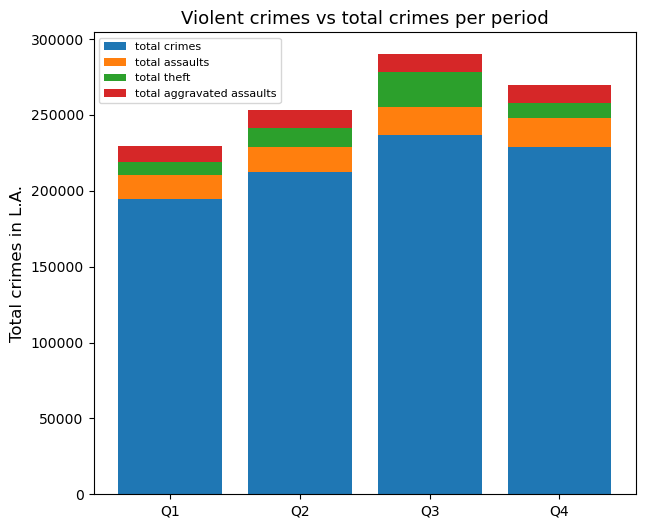

In [61]:
#(LR)# Setting up all our subplots
#Source: https://stackoverflow.com/questions/73660242/how-to-create-loop-to-build-matplotlib-bar-stacked-bar-graphs-using-a-dataframe
fig, ax = plt.subplots(figsize=(7,6))

# Editing each bars
ax.bar(total_violent_crm_year.index, total_violent_crm_year["Total Crimes per year"], label= "total crimes")

ax.bar(total_violent_crm_year.index, total_violent_crm_year["Total assaults per year"], label = "total assaults",
 bottom = total_violent_crm_year["Total Crimes per year"])

ax.bar(total_violent_crm_year.index, total_violent_crm_year["Total personal theft per year"], label = "total theft",
 bottom = total_violent_crm_year["Total assaults per year"] + total_violent_crm_year["Total Crimes per year"])

ax.bar(total_violent_crm_year.index, total_violent_crm_year["Total aggravated assaults per year"], label = "total aggravated assaults", 
bottom = total_violent_crm_year["Total assaults per year"] + total_violent_crm_year["Total Crimes per year"] 
+ total_violent_crm_year["Total personal theft per year"])

# Adding graphs element
ax.legend(fontsize="8")
ax.set_ylabel('Total crimes in L.A.', size=12)
ax.set_title("Violent crimes vs total crimes per period", size=13)


In [62]:
#(LR) # To build a dataframe per total assaults and total personal theft per year
total_crm_vs_asslt_theft = pd.DataFrame({
    "Total Crimes per year" : total_crimes,
    "Total assaults per year" : total_assault_year,
    "Total personal theft per year": total_theft_year
})
total_crm_vs_asslt_theft.set_index=(True)
total_crm_vs_asslt_theft

,Total Crimes per year,Total assaults per year,Total personal theft per year
Year,,,
Q1,194866,15461,8754
Q2,212653,16477,12367
Q3,237014,18024,23409
Q4,228809,18914,10345


In [63]:
#(LR) # To build a dataframe per total assaults
total_crm_vs_asslt = pd.DataFrame({
    "Total Crimes per year" : total_crimes,
    "Total assaults per year" : total_assault_year
 })
total_crm_vs_asslt.set_index=(True)
total_crm_vs_asslt

,Total Crimes per year,Total assaults per year
Year,,
Q1,194866,15461
Q2,212653,16477
Q3,237014,18024
Q4,228809,18914


In [65]:
#(LR) # To build a dataframe per quarter per total assaults - INFO ONLY 
assaults_summary = pd.DataFrame({
    "Total Crimes per quarter" : total_crime_quarter,
    "Total assaults per quarter" : assaults_quarter
})
assaults_summary.set_index=(True)
assaults_summary

,Total Crimes per quarter,Total assaults per quarter
date_occ,,
2020Q1,16152,1346
2020Q2,49667,3858
2020Q3,49438,4298
2020Q4,47816,3733
2021Q1,48004,3415
2021Q2,49838,3886
2021Q3,54938,4576
2021Q4,55428,4084
2022Q1,55955,4178


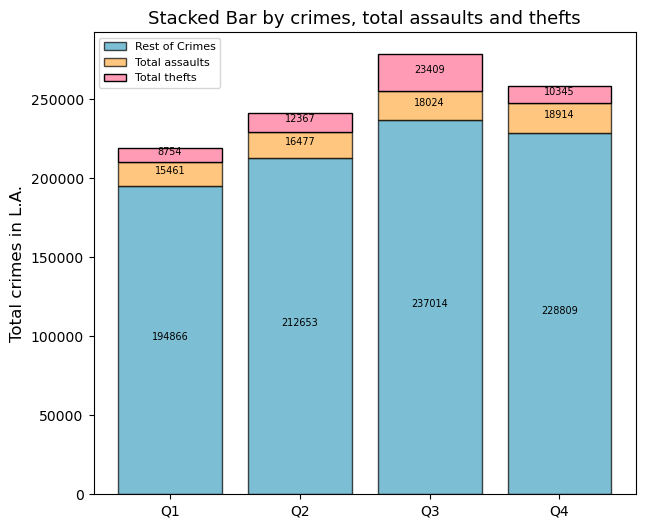

In [66]:
#(LR)# To build a stacked bar per year with total assaults total personal theft  vs total crimes
#https://python-charts.com/part-whole/stacked-bar-chart-matplotlib/
groups = total_crm_vs_asslt_theft.index
values1 = total_crm_vs_asslt_theft["Total Crimes per year"]
values2 = total_crm_vs_asslt_theft["Total assaults per year"]
values3 = total_crm_vs_asslt_theft["Total personal theft per year"]

fig, ax = plt.subplots(figsize=(7,6))
# Stacked bar chart
#Source for colors: https://www.colorhexa.com/ffae49
ax.bar(groups, values1, color = "#44a5c2", alpha=0.7,edgecolor = "black", linewidth = 1, label= "Rest of crimes")
ax.bar(groups, values2, color ="#ffae49", alpha=0.7,edgecolor = "black", linewidth = 1, bottom = values1, label= "Total assaults per year")
ax.bar(groups, values3, color ="#ff9bb5", alpha=1,edgecolor = "black", linewidth = 1, bottom = np.add(values1, values2))

# Labels
for bar in ax.patches:
  ax.text(bar.get_x() + bar.get_width() / 2,
          bar.get_height() / 2 + bar.get_y(),
          round(bar.get_height()), ha = 'center',
            size = 7)
labels_leyend = ["Rest of Crimes", "Total assaults", "Total thefts"]
ax.legend(labels=labels_leyend, fontsize="8")
ax.set_ylabel('Total crimes in L.A.', size=12)
ax.set_title("Stacked Bar by crimes, total assaults and thefts", size=13)
y_offset = 0


plt.show()

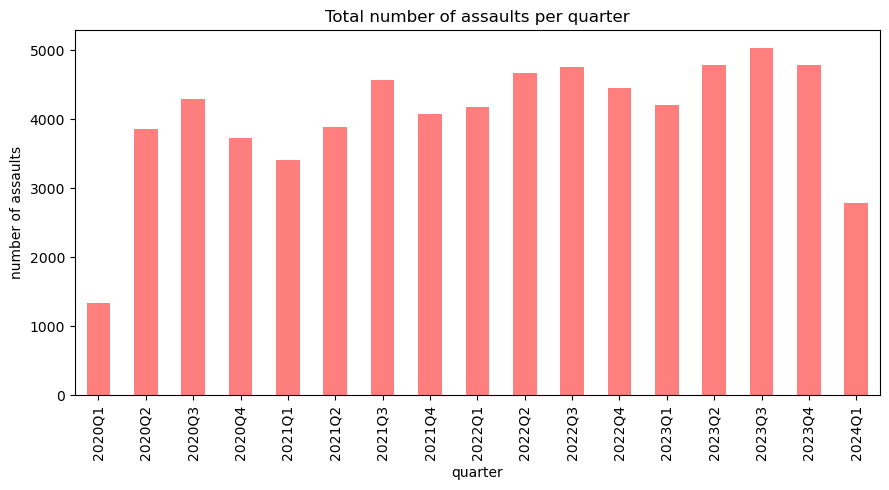

In [67]:
#(LR)# Create a bar chart based off of the group series from before
bar_chart_1 = assaults_quarter.plot(kind='bar', figsize=(9,5), color="red", alpha=0.5)

# Set the xlabel and ylabel using class methods
bar_chart_1.set_xlabel("quarter")
bar_chart_1.set_ylabel("number of assaults")
bar_chart_1.set_title("Total number of assaults per quarter")

plt.tight_layout()